## Application of EMIT Data: Agricultural Lands
### South Platte and Republican River Basins, CO, USA

The South Platte basin is the most populus river basin in Colorado with more than 70% of the state's population living within this region (**[Colorado Water Plan Version 2; South Platte/Metro](https://dnrweblink.state.co.us/cwcbsearch/0/edoc/216720/South_Platte-Metro_BIP_Volume2_2022.pdf)**). This region also has the greatest concentration of irrigated lands in the state.

![Water Figure 14](https://raw.githubusercontent.com/GSFC-618/618-hyrsense/main/images/water_fig14.png) <br>

Image source: https://cwcb.colorado.gov/colorado-water-plan/technical-update-to-the-plan

## Search and Download EMIT Data Products

In this notebook, we will use the 'earthaccess' Python package to search and download EMIT scenes which overlap agricultural lands in the South Platte river basin. Using this package, we can search for EMIT scenes using a region of interest and identify data granules which meet certain criteria for analysis (i.e., cloud cover, seasonality, etc). 

### Step 1. Setup notebook

First, we need to import packages and set up some environment variables for the notebook.

In [1]:
# Import modules 
import os, time, shutil, sys
import folium
import earthaccess
import warnings
import folium.plugins
import pandas as pd
import geopandas as gpd
import rioxarray as rxr
import rasterio as rio
import numpy as np
import math

from pathlib import Path
from rasterio.plot import show
from branca.element import Figure
from IPython.display import display
from shapely import geometry
from skimage import io
from datetime import timedelta
from shapely.geometry.polygon import orient
from matplotlib import pyplot as plt

# source custom functions located in ../tools/functions
module_name = 'helper_functions'
cwd = Path.cwd()
main_dir = os.path.abspath(os.path.join(cwd.parent,'..'))
functions_path = os.path.join(main_dir,'tools','functions')
sys.path.append(functions_path)
from helper_functions import get_shapely_object, convert_bounds

if module_name in sys.modules:
    print("***** Custom Modules: *****")
    print(f"The module '{module_name}' is loaded.")
else:
    print(f"The module '{module_name}' is not loaded.")
    
print("*** Packages loaded successfully! ***")

***** Custom Modules: *****
The module 'helper_functions' is loaded.
*** Packages loaded successfully! ***


### Optional tutorial configurations

In [33]:
# Save figures?
savefigs = True # True/False
# Create backup copy of the ortho images on your data store on iplant?
create_backup = True # True/False.
# Define some projections
albers = 'EPSG:5070' # Albers Equal Area CONUS
llwgs84 = 'EPSG:4326' # Geographic - Latitude/Longitude WGS84

########## Setup local tutorial folders ##########
user_name = os.popen('whoami').read().strip()
print("*** SMCE username: " + user_name + " ***")

# create your local tutorial directory in your $HOME
# Default: $HOME/tutorials
tutorials = os.path.join(os.path.expanduser("~"),"tutorials")

# Create local tutorial output folder
# Default: $HOME/tutorials/output/...
tutorial_output = os.path.join(tutorials,"output","hyrsense","agriculture")

# Location to backup downloaded data outside of the users $HOME scratch space. Optional and set using the create_backup flag above
# NOTE: This should really be set to the mounted s3 space or stored in unmounted s3 using aws cli commands
backup_location = os.path.join('/shared/users',user_name,'tutorials/output/hyrsense/agriculture/')

# Where should we put a local copy of the required tutorial dataset(s) for this tutorial?
# Default: $HOME/tutorials/tutorial_data/...
tutorial_data_dest = os.path.join(os.path.expanduser("~"),"tutorials","tutorial_data","hyrsense","agriculture")

*** SMCE username: sserbin ***


#### Transfer project data from the cloud

We want to copy over data stored on s3 so that we can access files quickly for analysis. To do this, we will use Python "shutil" package to copy the hyrsense files from the s3 bucket to a local, temporary location within your home directory. In this step we just copy the files for the "agriculture" module which contains data for this exercise.

In [4]:
"""
Copy the data-store to 'local' directory
This enables quick access to data files
"""
# Identify the location of the tutorial datasets - this is the source data used in the notebooks
tutorial_data_store_path = os.path.join('/shared/users/tutorial_data/hyrsense_data','data/agricultural_data')
# NOTE: This data should really live on s3 not in /shared/users

# Make local directories if they dont already exist
if not os.path.exists(tutorials):
    dest_dir_path = Path(tutorials)
    dest_dir_path.mkdir(parents=True, mode=0o777, exist_ok=True) # create the directory for the copied data, if needed
if not os.path.exists(tutorial_data_dest):
    dest_dir_path = Path(tutorial_data_dest)
    dest_dir_path.mkdir(parents=True, mode=0o777, exist_ok=True) # create the directory for the copied data, if needed
    
# Using 'shutil' package, copy all the files over
print("*** Local tutorial data location ***")
shutil.copytree(tutorial_data_store_path, tutorial_data_dest, dirs_exist_ok=True)
print(tutorial_data_dest)

# Create output directory for tutorial
if not os.path.exists(tutorial_output):
    dest_dir_path = Path(tutorial_output)
    dest_dir_path.mkdir(parents=True, mode=0o777, exist_ok=True) # create the directory for the copied data, if needed
print("*** Tutorial output location ***")
print(tutorial_output)

*** Local tutorial data location ***
/home/jovyan/tutorials/tutorial_data/hyrsense/agriculture
*** Tutorial output location ***
/home/jovyan/tutorials/output/hyrsense/agriculture


### Step 2. Load Data

#### Region of Interest: South Platte & Republican River Basins

Let's start by loading the boundary data for the South Platte river basin. This data comes from the Watershed Boundary Dataset (WBD) Hydrologic Unit Codes (HUC). Specifically, we are loading the HUC6 South Platte boundary.

EPSG:5070


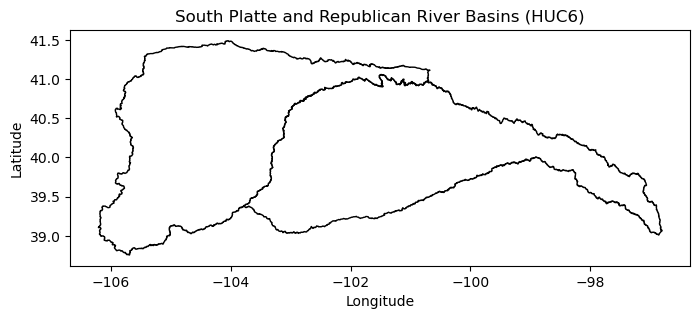

In [5]:
# Region of interest
roi = os.path.join(tutorial_data_dest,'WBD_HUC6_SouthPlatte_Republican.gpkg')
#roi_wgs84 = gpd.read_file(roi).to_crs(llwgs84)
roi = gpd.read_file(roi).to_crs(albers)
print(roi.crs)

# Plot the ROI data
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
# Use geographic coordinates
roi.to_crs(4326).plot(ax=ax, color='white', edgecolor='black')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('South Platte and Republican River Basins (HUC6)')

# save figure if requested
if savefigs:
    plt.savefig(os.path.join(tutorial_output,'HUC6_GIS.png'))

plt.show()

### Agricultural land use data

In order to get a better picture of where the agricultural land is within the basin, we will load two datasets from the National Agricultural Statistics Service (NASS); 1 - the Cropland Data Layer (CDL) cultivated lands mask, and 2 - the CDL crop type data. To learn more about these data, visit https://croplandcros.scinet.usda.gov.

In [6]:
# NASS CDL (ca. 2023)
cdl = os.path.join(tutorial_data_dest,'CDL_2023_CO_SouthPlatte_Republican.tif')
cdl = rxr.open_rasterio(cdl, mask=True, cache=False).squeeze().astype(rio.uint8)
cdl = cdl.where(cdl != 0, np.nan)  # handle NA values
print(cdl)
print(cdl.rio.crs) # Check to make sure the projection matches (EPSG:5070)
# cdl = cdl.rio.clip(roi.geometry) # clip to the roi for consistency

<xarray.DataArray (y: 8324, x: 12282)> Size: 818MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(8324, 12282))
Coordinates:
  * y            (y) float64 67kB 2.039e+06 2.039e+06 ... 1.79e+06 1.79e+06
  * x            (x) float64 98kB -8.731e+05 -8.731e+05 ... -5.047e+05
    band         int64 8B 1
    spatial_ref  int64 8B 0
Attributes:
    TIFFTAG_SOFTWARE:        E
    TIFFTAG_XRESOLUTION:     1
    TIFFTAG_YRESOLUTION:     1
    TIFFTAG_RESOLUTIONUNIT:  2 (pixels/inch)
    AREA_OR_POINT:           Area
    LAYER_TYPE:              thematic
    scale_factor:            1.0
    add_offset:              0.0
    long_name:               Layer_1
EPSG:5070


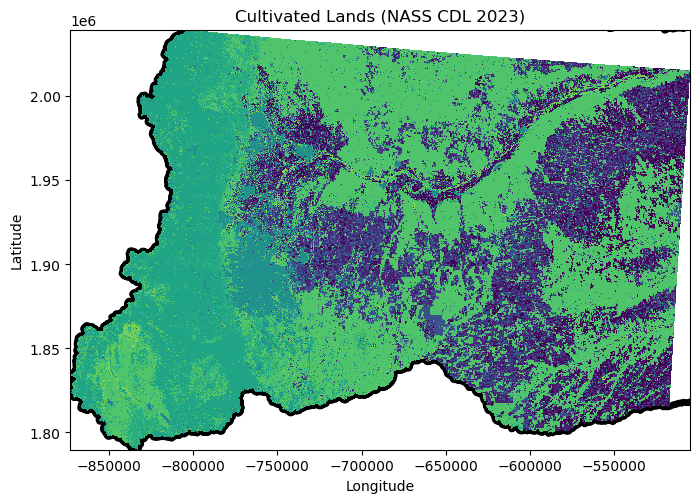

In [7]:
# Plot the ROI data
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
roi.plot(ax=ax, color='white', edgecolor='black', linewidth=5.0)
cdl.plot(ax=ax, add_colorbar=False, cmap='viridis')  # Customize the colormap as needed
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Cultivated Lands (NASS CDL 2023)')

# save figure if requested
if savefigs:
    plt.savefig(os.path.join(tutorial_output,'NASS_CDL_2023_Cultivated_lands.png'))

plt.show()

## Search for EMIT Data

Using the 'earthaccess' Python package, we can search for EMIT data which overlaps our region of interest. In order to identify data which we can use for analysis, we will also filter for things like season and cloud cover using the metadata for EMIT granules. 

In [8]:
import earthaccess 

# Log in to your NASA Earthdata account to access the EarthData API
# You only have to do this once in your session (persist=True saves the credentials)
earthaccess.login(persist=True)

Now we can use the search functionality of 'earthaccess' to identify data products related to the EMIT mission. This code chunk will return "short names" of the data products available. To get a better idea of what each of these products are, you can do a quick search using these short names. For example, to read more about the L2A Estimated Surface Reflectance and Uncertainty and Masks 60-m product you can visit: https://lpdaac.usgs.gov/products/emitl2arflv001/ which pops up when searching the short name "EMITL2ARFL".

In [9]:
# Query the collections
Query = earthaccess.collection_query().keyword('emit').provider('LPCLOUD')
print(f'Collections found: {Query.hits()}')
# Return EMIT specific products
collections = Query.fields(['ShortName']).get(Query.hits())
# Retrieve Collection Short-names
[product['short-name'] for product in [collection.summary() for collection in collections]]

Collections found: 13


['EMITL2ARFL',
 'EMITL1BRAD',
 'EMITL2BCH4ENH',
 'EMITL2BCH4PLM',
 'EMITL2BMIN',
 'EMITL2BCH4ENH',
 'EMITL2BCO2ENH',
 'EMITL2BCO2ENH',
 'EMITL2BCO2PLM',
 'EMITL4ESM',
 'EMITL1BATT',
 'EMITL3ASA',
 'EMITL3ASA']



To use a region of interest (ROI) polygon to search for EMIT data, we need to extract the coordinate pairs from our ROI (South Platte) which are then used in the search criteria. The code below will work for a single polygon or for multiple polygons if you wanted to search for data across a variety of ROIs. In this example, we use just one ROI, the South Platte River Basin.

In [11]:
# ~ Extract a list coordinate pairs for ROI ~

# First, reproject to WGS84 for coordinates are in lat/long
roi = roi.to_crs(epsg=4326)

# Extract the bounds
coord_list = []
for iter, row in roi.iterrows():    
    bounds = row['geometry'].bounds
    coord_list.append(bounds)
print(coord_list)

[(-103.79208180245091, 39.008717666783106, -96.79867478067109, 41.05791810115464), (-106.21024429644497, 38.75298161065469, -100.67702506458626, 41.48930095199614)]


Now we can run a search for EMIT L2A Reflectance data (short name = 'EMITL2ARFL'). To start, we will search for EMIT data during the **2023 growing season (May-Sept)**. The results from our search is a list of granules which meet the criteria. These granules have associated metadata and we can convert the search results to a data frame to access the granule attributes.

In [12]:
# Search for EMIT data
search_results = earthaccess.search_data(
    short_name='EMITL2ARFL',
    bounding_box=coord_list[0], # we use [0] here because we only have one coordinate pair
    temporal=('2023-05-01','2023-09-28'),
    count=150
)
# Extract the metadata json as data frame
search_df = pd.json_normalize(search_results)
search_df.head()

,size,meta.concept-type,meta.concept-id,meta.revision-id,meta.native-id,meta.collection-concept-id,meta.provider-id,meta.format,meta.revision-date,umm.TemporalExtent.RangeDateTime.BeginningDateTime,...,umm.PGEVersionClass.PGEVersion,umm.RelatedUrls,umm.CloudCover,umm.DataGranule.DayNightFlag,umm.DataGranule.ArchiveAndDistributionInformation,umm.DataGranule.ProductionDateTime,umm.Platforms,umm.MetadataSpecification.URL,umm.MetadataSpecification.Name,umm.MetadataSpecification.Version
0,6970.757812,granule,G2698968204-LPCLOUD,3,EMIT_L2A_RFL_001_20230526T220753_2314615_015,C2408750690-LPCLOUD,LPCLOUD,application/vnd.nasa.cmr.umm+json,2024-10-25T06:06:31.960Z,2023-05-26T22:07:53Z,...,v1.3.3,[{'URL': 'https://opendap.earthdata.nasa.gov/c...,86,Day,[{'Name': 'EMIT_L2A_RFL_001_20230526T220753_23...,2023-06-22T15:37:08Z,"[{'ShortName': 'ISS', 'Instruments': [{'ShortN...",https://cdn.earthdata.nasa.gov/umm/granule/v1.6.6,UMM-G,1.6.6
1,6085.531630,granule,G2699390840-LPCLOUD,3,EMIT_L2A_RFL_001_20230527T212041_2314714_025,C2408750690-LPCLOUD,LPCLOUD,application/vnd.nasa.cmr.umm+json,2024-10-25T05:37:43.766Z,2023-05-27T21:20:41Z,...,v1.3.3,[{'URL': 'https://opendap.earthdata.nasa.gov/c...,53,Day,[{'Name': 'EMIT_L2A_RFL_001_20230527T212041_23...,2023-06-22T15:52:43Z,"[{'ShortName': 'ISS', 'Instruments': [{'ShortN...",https://cdn.earthdata.nasa.gov/umm/granule/v1.6.6,UMM-G,1.6.6
2,3573.766212,granule,G2701558257-LPCLOUD,3,EMIT_L2A_RFL_001_20230529T211923_2314914_022,C2408750690-LPCLOUD,LPCLOUD,application/vnd.nasa.cmr.umm+json,2024-10-25T05:51:48.520Z,2023-05-29T21:19:23Z,...,v1.3.3,[{'URL': 'https://opendap.earthdata.nasa.gov/c...,98,Day,[{'Name': 'EMIT_L2A_RFL_001_20230529T211923_23...,2023-06-22T16:41:04Z,"[{'ShortName': 'ISS', 'Instruments': [{'ShortN...",https://cdn.earthdata.nasa.gov/umm/granule/v1.6.6,UMM-G,1.6.6
3,3573.870282,granule,G2701558268-LPCLOUD,3,EMIT_L2A_RFL_001_20230529T211935_2314914_023,C2408750690-LPCLOUD,LPCLOUD,application/vnd.nasa.cmr.umm+json,2024-10-25T06:26:50.794Z,2023-05-29T21:19:35Z,...,v1.3.3,[{'URL': 'https://opendap.earthdata.nasa.gov/c...,99,Day,[{'Name': 'EMIT_L2A_RFL_001_20230529T211935_23...,2023-06-22T16:41:10Z,"[{'ShortName': 'ISS', 'Instruments': [{'ShortN...",https://cdn.earthdata.nasa.gov/umm/granule/v1.6.6,UMM-G,1.6.6
4,3580.262438,granule,G2701609072-LPCLOUD,3,EMIT_L2A_RFL_001_20230530T203035_2315014_023,C2408750690-LPCLOUD,LPCLOUD,application/vnd.nasa.cmr.umm+json,2024-10-25T05:56:06.339Z,2023-05-30T20:30:35Z,...,v1.3.3,[{'URL': 'https://opendap.earthdata.nasa.gov/c...,62,Day,[{'Name': 'EMIT_L2A_RFL_001_20230530T203035_23...,2023-06-17T23:36:30Z,"[{'ShortName': 'ISS', 'Instruments': [{'ShortN...",https://cdn.earthdata.nasa.gov/umm/granule/v1.6.6,UMM-G,1.6.6


In [13]:
print("Total number of granules found: " + str(len(search_df)))

Total number of granules found: 113


You can see above that we have identified 112 separate granules that meet our current search requirements

In [14]:
# Get a list of columns from the search results / metadata
print(search_df.columns)

Index(['size', 'meta.concept-type', 'meta.concept-id', 'meta.revision-id',
       'meta.native-id', 'meta.collection-concept-id', 'meta.provider-id',
       'meta.format', 'meta.revision-date',
       'umm.TemporalExtent.RangeDateTime.BeginningDateTime',
       'umm.TemporalExtent.RangeDateTime.EndingDateTime', 'umm.GranuleUR',
       'umm.AdditionalAttributes',
       'umm.SpatialExtent.HorizontalSpatialDomain.Geometry.GPolygons',
       'umm.ProviderDates', 'umm.CollectionReference.ShortName',
       'umm.CollectionReference.Version', 'umm.PGEVersionClass.PGEName',
       'umm.PGEVersionClass.PGEVersion', 'umm.RelatedUrls', 'umm.CloudCover',
       'umm.DataGranule.DayNightFlag',
       'umm.DataGranule.ArchiveAndDistributionInformation',
       'umm.DataGranule.ProductionDateTime', 'umm.Platforms',
       'umm.MetadataSpecification.URL', 'umm.MetadataSpecification.Name',
       'umm.MetadataSpecification.Version'],
      dtype='object')


While the list suggests we have 112 granules, we need to apply some additional requirements to ensure the datasets are useable for our application. For example, clouds and cloud cover can impact any analyses looking at the land surface and we often want to "screen out" or filter out granules that have substantial cloud cover impacting our region of interest


## Filter EMIT granules and select 

In this section we will apply additional data filters to find granules that meet our research requirements. In this case we will select those with low cloud cover

In [15]:
# Find cloud-free granules
print("Cloud cover statistics for granules: \n")
print(search_df['umm.CloudCover'].describe())
print("~~~~~~~~~~~~~~")

# How many granules have less than 5% cloud cover?
no_clouds_n = (search_df['umm.CloudCover'] <= 5).sum()
print(f"Number of granules with less than or equal to 5% cloud cover: {no_clouds_n}")
print("~~~~~~~~~~~~~~")

# Filter our search results to just these low cloud granules
search_df_nc = search_df[search_df['umm.CloudCover'] <= 5]

Cloud cover statistics for granules: 

count    113.000000
mean      42.407080
std       36.660274
min        0.000000
25%        4.000000
50%       37.000000
75%       82.000000
max      100.000000
Name: umm.CloudCover, dtype: float64
~~~~~~~~~~~~~~
Number of granules with less than or equal to 5% cloud cover: 34
~~~~~~~~~~~~~~


After searching for relatively cloud free images, we now see that the total number drops to 34.

Now we have a data frame with EMIT granules during the growing season with 0% cloud cover. To further refine this list, lets take a look at the dates of the granules. 

In [16]:
# Print the acquisition dates for our no cloud granules
print(search_df_nc['umm.TemporalExtent.RangeDateTime.BeginningDateTime'].unique())

['2023-06-10T16:23:30Z' '2023-06-19T18:47:45Z' '2023-06-25T17:08:38Z'
 '2023-06-25T17:08:50Z' '2023-06-26T16:20:23Z' '2023-06-26T16:20:35Z'
 '2023-06-26T16:20:47Z' '2023-07-26T21:44:53Z' '2023-07-26T21:45:05Z'
 '2023-07-26T21:45:17Z' '2023-07-26T21:45:29Z' '2023-07-29T20:56:18Z'
 '2023-07-29T20:56:30Z' '2023-07-29T20:56:42Z' '2023-07-29T20:56:53Z'
 '2023-08-10T16:05:49Z' '2023-08-14T21:00:30Z' '2023-08-14T21:00:41Z'
 '2023-08-14T21:00:53Z' '2023-08-15T20:13:30Z' '2023-08-18T19:26:16Z'
 '2023-08-18T19:26:28Z' '2023-08-18T19:26:40Z' '2023-08-18T19:26:52Z'
 '2023-08-18T19:27:04Z' '2023-08-19T18:39:03Z' '2023-08-22T17:51:06Z'
 '2023-08-22T17:51:18Z' '2023-08-22T17:51:30Z' '2023-08-22T17:51:41Z'
 '2023-08-22T17:51:53Z' '2023-08-22T17:52:17Z' '2023-09-25T21:48:47Z'
 '2023-09-25T21:48:58Z']


It looks like we have some good options for EMIT granules! To get a better idea of the spatial extent of these granules, we can plot their footprints on a map using the metadata from the data search results.

Thankfully, the metadata data frame contains information about the spatial extent for each granule which allows us to plot them on an interactive map using 'folium'. We can extract the spatial information and convert that to a geometry with the custom function below "get_shapely_object".  To do this we will use two custom functions located in ../tools/functions/helper_functions.py (get_shapely_object() && convert_bounds())

In [20]:
### Retrieve the bounding information
# Create shapely polygons for result - using custom function located in helper_functions.py
geometries = [get_shapely_object(search_results[index]) for index in search_df_nc.index.to_list()]
# Convert to GeoDataframe
results_gdf = gpd.GeoDataFrame(search_df_nc, geometry=geometries, crs="EPSG:4326")
# Ensure 'start_datetime' and other relevant datetime columns are strings
results_gdf['start_datetime'] = results_gdf['umm.TemporalExtent.RangeDateTime.BeginningDateTime'].astype(str)
results_gdf = results_gdf[['meta.native-id','start_datetime','geometry']]

# Create the interactive map using folium
fig = Figure(width="750px", height="375px")
map1 = folium.Map(tiles='https://mt1.google.com/vt/lyrs=y&x={x}&y={y}&z={z}', attr='Google')
fig.add_child(map1)

# Plot Region of Interest
roi.drop(columns=['LOADDATE']).explore(
    popup=False,
    style_kwds=dict(fillOpacity=0.1, width=2),
    name="South Platte River Basin",
    m=map1
)

results_gdf.explore(
    "meta.native-id",
    categorical=True,
    tooltip=[
        "meta.native-id",
        "start_datetime",
    ],
    popup=True,
    style_kwds=dict(fillOpacity=0.1, width=2),
    name="EMIT",
    m=map1,
    legend=False
)

map1.fit_bounds(bounds=convert_bounds(results_gdf.union_all().bounds))
map1.add_child(folium.LayerControl())
display(fig)

Using the interactive map above, you can now review the remaining granules meeting our research and location requirements. Using the map you can scroll around, hover over specific granule outlines to see details, or click on specific image outlines to get the details.  You can also zoom in and out to review areas with multiple overlapping granules from different dates

## Select and download EMIT granules to use in the rest of the tutorial

Based on the results above we will select four granules from 2023-07-29 that represent a small stip of images covering a large fraction of the agricultural landscapoe in the Southwestern/Northeastern portion of Nebraska and Colorado

In [22]:
# Lets define the 4 granules from 2023-07-29 to download for the tutorial
selected_granules = ['EMIT_L2A_RFL_001_20230729T205653_2321014_021',
                     'EMIT_L2A_RFL_001_20230729T205642_2321014_020',
                     'EMIT_L2A_RFL_001_20230729T205630_2321014_019',
                     'EMIT_L2A_RFL_001_20230729T205618_2321014_018']

# Filter our metadata, plot the selected granules
granules = search_df_nc[search_df_nc['meta.native-id'].isin(selected_granules)]
granules_gdf = results_gdf[results_gdf['meta.native-id'].isin(selected_granules)]

# Create the interactive map using folium
fig = Figure(width="750px", height="375px")
map1 = folium.Map(tiles='https://mt1.google.com/vt/lyrs=y&x={x}&y={y}&z={z}', attr='Google')
fig.add_child(map1)

# Plot Region of Interest
roi.drop(columns=['LOADDATE']).explore(
    popup=False,
    style_kwds=dict(fillOpacity=0.1, width=2),
    name="South Platte River Basin",
    m=map1
)

granules_gdf.explore(
    "meta.native-id",
    categorical=True,
    tooltip=[
        "meta.native-id",
        "start_datetime",
    ],
    popup=True,
    style_kwds=dict(fillOpacity=0.1, width=2),
    name="EMIT",
    m=map1,
    legend=False
)

map1.fit_bounds(bounds=convert_bounds(granules_gdf.union_all().bounds))
map1.add_child(folium.LayerControl())
display(fig)

Note: You can see in the map above the specific granules we have selected to download and work with in the tutorials

### Now lets download the four selected 

We will use a simple loop to download the granules from EarthData below and provide us a verbose output showing the progress of the data downloading.  The first time you run this you will note that a new "EMIT" folder is created in "HYR-SENSE/data/Agriculture/" 

In [25]:
# Download the scenes and store in your "local" working/scratch folder for faster I/O and data access in the remaining tutorials
# local relates to the path /home/jovyan/HYR-SENSE/data/

# Retrieve the download URL
granule_ids = [f"{granule}/{granule}.nc" for granule in granules['umm.GranuleUR']]

# Get Https Session using Earthdata Login Info
fs = earthaccess.get_fsspec_https_session()

# Base download URL
base_url = 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/EMITL2ARFL.001'

# Define local storage location - this was set in the options at the start of the tutorial
# We will append "emit" to the path to place the downloaded data in a separate folder
#loc_file_path = os.path.join('/home/jovyan/HYR-SENSE/data/Agriculture/emit/')
loc_file_path = os.path.join(tutorial_output,'emit/')
if not os.path.exists(loc_file_path):
    os.mkdir(loc_file_path)

# Download the data granules
t0 = time.time()

for granule_id in granule_ids:
    print(granule_id)
    print("Granule ID: " + granule_id.split('/')[1])
    granule_asset_id = granule_id.split('/')[1]
    out_path = loc_file_path + f'{granule_asset_id}'

    # Download the Granule Asset if it doesn't exist
    url = os.path.join(base_url,granule_id)
    if not os.path.isfile(out_path):
        fs.download(url, out_path)

print('Total time:', round(time.time() - t0,3), 'seconds')

EMIT_L2A_RFL_001_20230729T205618_2321014_018/EMIT_L2A_RFL_001_20230729T205618_2321014_018.nc
Granule ID: EMIT_L2A_RFL_001_20230729T205618_2321014_018.nc
EMIT_L2A_RFL_001_20230729T205630_2321014_019/EMIT_L2A_RFL_001_20230729T205630_2321014_019.nc
Granule ID: EMIT_L2A_RFL_001_20230729T205630_2321014_019.nc
EMIT_L2A_RFL_001_20230729T205642_2321014_020/EMIT_L2A_RFL_001_20230729T205642_2321014_020.nc
Granule ID: EMIT_L2A_RFL_001_20230729T205642_2321014_020.nc
EMIT_L2A_RFL_001_20230729T205653_2321014_021/EMIT_L2A_RFL_001_20230729T205653_2321014_021.nc
Granule ID: EMIT_L2A_RFL_001_20230729T205653_2321014_021.nc
Total time: 0.0 seconds


Let's also save the geospatial footprints for our selected tiles. This will be useful in the following notebooks associated with this tutorial.

In [27]:
out_fpath = os.path.join(loc_file_path,'emit_granule_footprints.gpkg')
granules_gdf.to_file(out_fpath)
print(f"EMIT footprints saved to {out_fpath}")

EMIT footprints saved to /home/jovyan/tutorials/output/hyrsense/agriculture/emit/emit_granule_footprints.gpkg


### OPTIONAL: If you only want to download a single granule, we can select the image centered on Yuma, Colorado from July 29th 2023

In [31]:
selected_granules = ['EMIT_L2A_RFL_001_20230729T205630_2321014_019']

# Filter our metadata, plot the selected granules
granules = search_df_nc[search_df_nc['meta.native-id'].isin(selected_granules)]
granules_gdf = results_gdf[results_gdf['meta.native-id'].isin(selected_granules)]

# Create the interactive map using folium
fig = Figure(width="750px", height="375px")
map1 = folium.Map(tiles='https://mt1.google.com/vt/lyrs=y&x={x}&y={y}&z={z}', attr='Google')
fig.add_child(map1)

# Plot Region of Interest
roi.drop(columns=['LOADDATE']).explore(
    popup=False,
    style_kwds=dict(fillOpacity=0.1, width=2),
    name="South Platte River Basin",
    m=map1
)

granules_gdf.explore(
    "meta.native-id",
    categorical=True,
    tooltip=[
        "meta.native-id",
        "start_datetime",
    ],
    popup=True,
    style_kwds=dict(fillOpacity=0.1, width=2),
    name="EMIT",
    m=map1,
    legend=False
)

map1.fit_bounds(bounds=convert_bounds(granules_gdf.union_all().bounds))
map1.add_child(folium.LayerControl())
display(fig)

print(granules_gdf)

                                  meta.native-id        start_datetime  \
63  EMIT_L2A_RFL_001_20230729T205630_2321014_019  2023-07-29T20:56:30Z   

                                             geometry  
63  POLYGON ((-102.52433 40.80848, -103.49133 40.2...  


### Download the EMIT_L2A_RFL_001_20230729T205630_2321014_019

Will only download if the file doesnt already exist.  If it already exists, it will skip downloading and print back the granule ID

In [32]:
### Download the scenes, store in working/scratch folder for faster I/O and data access in the remaining tutorials
# Retrieve the download URL
granule_ids = [f"{granule}/{granule}.nc" for granule in granules['umm.GranuleUR']]

# Get Https Session using Earthdata Login Info
fs = earthaccess.get_fsspec_https_session()

# Base download URL
base_url = 'https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/EMITL2ARFL.001'

# Define local storage location - this was set in the options at the start of the tutorial
# We will append "emit" to the path to place the downloaded data in a separate folder
#loc_file_path = os.path.join('/home/jovyan/HYR-SENSE/data/Agriculture/emit/')
loc_file_path = os.path.join(tutorial_output,'emit/')
if not os.path.exists(loc_file_path):
    os.mkdir(loc_file_path)

# Download the data granules
t0 = time.time()

for granule_id in granule_ids:
    print(granule_id)
    print("Granule ID: " + granule_id.split('/')[1])
    granule_asset_id = granule_id.split('/')[1]
    out_path = loc_file_path + f'{granule_asset_id}'
    print(out_path)
    # Download the Granule Asset if it doesn't exist
    url = os.path.join(base_url,granule_id)
    if not os.path.isfile(out_path):
        fs.download(url, out_path)
    if os.path.isfile(out_path):
        print("*** Already downloaded ***")
        print(" ")

print('Total time:', round(time.time() - t0,3), 'seconds')

EMIT_L2A_RFL_001_20230729T205630_2321014_019/EMIT_L2A_RFL_001_20230729T205630_2321014_019.nc
Granule ID: EMIT_L2A_RFL_001_20230729T205630_2321014_019.nc
/home/jovyan/tutorials/output/hyrsense/agriculture/emit/EMIT_L2A_RFL_001_20230729T205630_2321014_019.nc
*** Already downloaded ***
 
Total time: 0.001 seconds


## OPTIONAL: Create a copy of the downloaded tutorial data in your /shared/users/ or s3/ space

Let's create a backup copy from what is in the current scratch folder for later use and to avoid having to download again. You define the desired backup location at the start of this notebook in the user options step

In [34]:
# (Optional) Create a backup copy of the downloaded data in your shared space
if create_backup:
    user_name = os.popen('whoami').read().strip()
    print("*** SMCE username: " + user_name)
    src_dir = os.path.join(tutorial_output,'emit/')
    dest_dir = os.path.join(backup_location,'emit/')
    if not os.path.exists(dest_dir):
        dest_dir_path = Path(dest_dir)
        dest_dir_path.mkdir(parents=True, exist_ok=True) # create the directory for the copied data, if needed
    # Using 'shutil' package, copy all the files over
    shutil.copytree(src_dir, dest_dir, dirs_exist_ok=True)
    print("")
    print("")
    print("**** Copy complete!! ****")
else:
    print("")
    print("*** Skipping backup of ortho images ***")

*** SMCE username: sserbin


**** Copy complete!! ****
